<a href="https://colab.research.google.com/github/eduardarsimoes/lae1/blob/main/Estacoes/Imagens/EstacoesES_Regressao_Linear.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **DATASET: Estações climáticas ES**
---
### **LAB. EXTENSÃO 2020/2 EAD** - Eduarda Simões, Serenna Ferrari e Thaís de Souza

### Importando bibliotecas e respectivos módulos

In [2]:
# Importando bibliotecas
import sklearn as skl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn import preprocessing
from sklearn import model_selection
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from pandas_profiling import ProfileReport

In [3]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.12.0-py2.py3-none-any.whl size=243829 sha256=984d6cd34fc55c9e2fe020df8032eabd592db013386049bafd91fd428169ecdb
  Stored in directory: /tmp/pip-ephem-wheel-cache-rd7vbglk/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


### Carregando dataset e resumo de dados


In [4]:
url = "https://raw.githubusercontent.com/profmoisesomena/escience_and_tools/master/data/estacoes_es_summary.csv"

dataset = pd.read_csv(url, header=0)
# ETP = Evapotranspiração potencial | ETR = Evapotranspiração real | DEF = Deficiência hídrica (ETP - ETR) | EXC = Excedente hídrico (pode ser 0)

pd.pandas.set_option('display.max_columns', None)
print(dataset.head())

                Municipios  Altitude  X_coord  Y_coord        CHUVA  \
0  EstacaoMeteorologicaES1        66   -39.96   -18.30  1036.980000   
1  EstacaoMeteorologicaES2         3   -39.75   -18.56  1164.716667   
2  EstacaoMeteorologicaES3         6   -39.76   -18.95  1394.900000   
3  EstacaoMeteorologicaES4       180   -40.75   -18.99  1250.843333   
4  EstacaoMeteorologicaES5        90   -40.09   -18.49  1127.650000   

           ETP          ETR         DEF        EXC    ER/ETP  TEMP_MÉD_ANUAL  
0  1382.294237  1036.980000  345.314237   0.000000  0.750188       24.849550  
1  1413.227948  1164.716667  248.511281   0.000000  0.824153       25.061532  
2  1397.763967  1298.498162   99.265805  96.401838  0.928982       24.959973  
3  1341.710579  1151.705054  190.005525  99.138279  0.858386       24.529823  
4  1367.365007  1127.650000  239.715007   0.000000  0.824688       24.743049  


### Análise exploratória dos dados

In [5]:
#GERANDO O PROFILING REPORT (EDA)
profile = ProfileReport(dataset, title = "Estacoes ES dataset", html={"style": {"full_width": True}}, sort="None") 
profile.to_file('estacoesES_raw.html')

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
profile.to_notebook_iframe()

### Pré processamento

In [7]:
#REMOVENDO ATRIBUTOS
dataset.drop(["Municipios","ER/ETP"], axis = 1, inplace = True) #axis = 1 (toda coluna) | inplace = True (replace)
print(dataset.head())

   Altitude  X_coord  Y_coord        CHUVA          ETP          ETR  \
0        66   -39.96   -18.30  1036.980000  1382.294237  1036.980000   
1         3   -39.75   -18.56  1164.716667  1413.227948  1164.716667   
2         6   -39.76   -18.95  1394.900000  1397.763967  1298.498162   
3       180   -40.75   -18.99  1250.843333  1341.710579  1151.705054   
4        90   -40.09   -18.49  1127.650000  1367.365007  1127.650000   

          DEF        EXC  TEMP_MÉD_ANUAL  
0  345.314237   0.000000       24.849550  
1  248.511281   0.000000       25.061532  
2   99.265805  96.401838       24.959973  
3  190.005525  99.138279       24.529823  
4  239.715007   0.000000       24.743049  


### Análise dos dados pós pré processamento

In [8]:
#GERANDO O PROFILING REPORT
profile = ProfileReport(dataset, title="Estacos ES Dataset Pós", html={"style": {"full_width": True}}, sort="None")
profile.to_file("estacoesES_done.html")

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:433: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

### Separando conjuntos de dados

In [10]:
#SEPARANDO
Y = dataset['TEMP_MÉD_ANUAL']
X = dataset['Altitude']

In [12]:
d = {'altitude': X, 'temperatura': Y}
df = pd.DataFrame(data=d)
df.head(10)

,altitude,temperatura
0,66,24.849550
1,3,25.061532
2,6,24.959973
3,180,24.529823
4,90,24.743049
5,192,24.612656
6,280,24.116973
7,60,24.760755
8,190,24.769793
9,300,23.686791


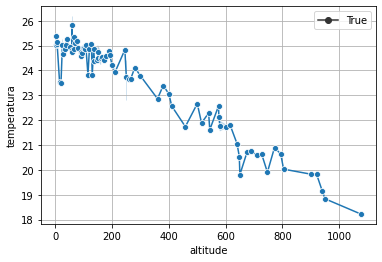

In [13]:
#DISTRIBUIÇÃO DOS PONTOS
plt.grid(True)
grafico = sns.lineplot(data = df, x = 'altitude', y = 'temperatura', markers = True, style = True)

In [14]:
X = df.iloc[:,:1].values
y = df.temperatura.values

### Criando modelo

In [15]:
model = LinearRegression()
model.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

### Obtendo valores estimados

In [16]:
y_pred = model.predict(X)
y_pred[:10]

array([24.95943518, 25.36274335, 25.3435382 , 24.22963944, 24.80579397,
       24.15281884, 23.58946774, 24.99784548, 24.16562227, 23.4614334 ])

### Métricas

In [34]:
# MSE
print("MSE      = {0:.3f}".format(mean_squared_error(y, y_pred)*100))

# R²
print("R² score = {0:.3f}%".format(r2_score(y, y_pred) *100))

MSE      = 22.393
R² score = 93.137%


### Estimação

In [32]:
#COEFICIENTES
b0 = model.intercept_
b1 = model.coef_[0]
print("Coeficiente Linear  (b0) = {}\nCoeficiente Angular (b1) = {}".format(b0,b1))

Coeficiente Linear  (b0) = 25.381948498880043
Coeficiente Angular (b1) = -0.006401716992726068


In [29]:
#VERIFICANDO 10 LINHAS
for indice in range(10):
  x = df.loc[indice]['altitude']
  temperatura_real = df.loc[indice]['temperatura']
  predito = b0 + b1*x
  predito
  print("Altitude            = {}\nTemperatura predita = {}\n
  Temperatura real    = {}\n
  Resíduo             = {}\n\n".format(x, predito, temperatura_real, temperatura_real - predito))

Altitude            = 66.0
Temperatura predita = 24.95943517736012
Temperatura real    = 24.8495505
Resíduo             = -0.10988467736012097


Altitude            = 3.0
Temperatura predita = 25.362743347901866
Temperatura real    = 25.0615323333333
Resíduo             = -0.30121101456856536


Altitude            = 6.0
Temperatura predita = 25.343538196923685
Temperatura real    = 24.9599734166667
Resíduo             = -0.3835647802569859


Altitude            = 180.0
Temperatura predita = 24.22963944018935
Temperatura real    = 24.5298230833333
Resíduo             = 0.30018364314395285


Altitude            = 90.0
Temperatura predita = 24.805793969534697
Temperatura real    = 24.74304925
Resíduo             = -0.06274471953469885


Altitude            = 192.0
Temperatura predita = 24.152818836276637
Temperatura real    = 24.61265575
Resíduo             = 0.4598369137233611


Altitude            = 280.0
Temperatura predita = 23.589467740916742
Temperatura real    = 24.11697275
Resíduo

### Gráfico resultado

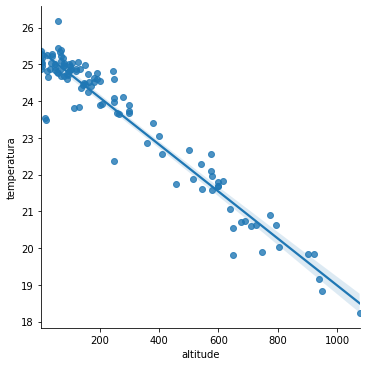

In [20]:
result = sns.lmplot(x = 'altitude', y = 'temperatura', data = df)